# **Strategize Bridge Maintenance Effectively**




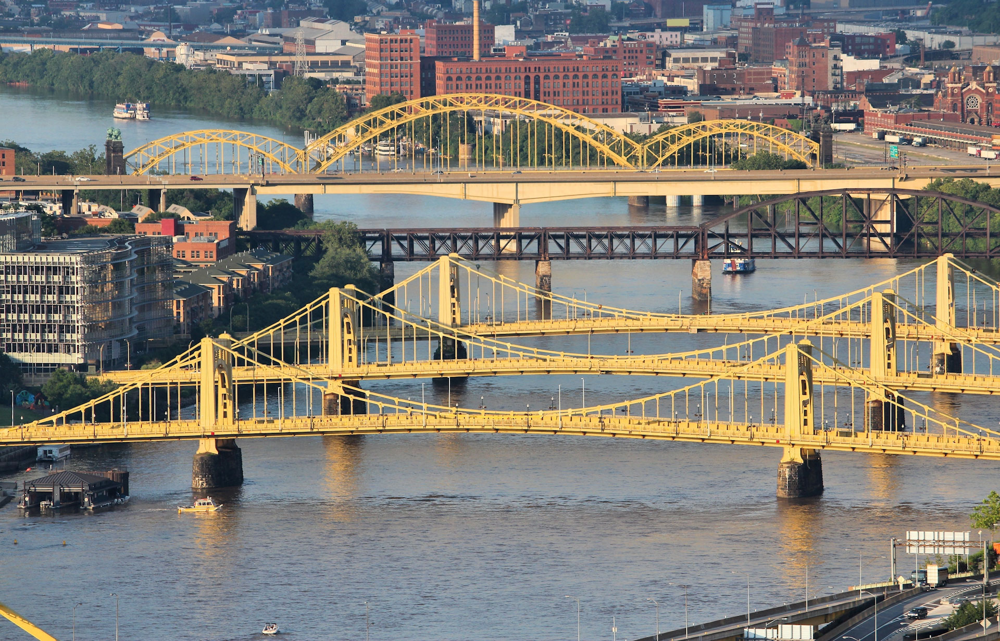 
Source: https://www.webuildvalue.com/wp-content/uploads/2022/02/pittsburgh-bridge-collapse.jpg

*This analysis was originally a project I (Monika Sembiring) did with my friend Tina Feng in our 95885 - Data Science and Big Data class at Carnegie Mellon University.*

# 1. Executive Summary

**Prioritizing maintenance for bridges in Allegheny County with these criteria:**
1. Best model for bridge condition classification is **Random Forest**, with an **accuracy of 77.8%** and a **recall rate of 64.1%**.
2. The most essential features in determining bridges' condition are **Substructure Condition**, **Superstructure Condition**, **Reconstruction Age**, **Age**, **Deck Condition**, and **Rehab/Replace Eligibility**.
3. On top of the predicted condition result, maintenance prioritization will be evaluated with the **availability of alternative routes**, **bridge size**, **traffic amount**, and **estimated maintenance cost**.

Presentation Video Link: 
https://www.youtube.com/watch?v=z8hvd9e32dk

# 2. Problem Statement

## 2.1. Background and Motivation
Pittsburgh is the City of Bridges, with nearly 450 bridges. In January 2022, President Biden came to visit Pittsburgh to discuss infrastructure. However, in the morning before his visit, Fern Hollow Bridge collapsed. The detail can be read in this article [Pittsburgh Bridge Collapses Hours Before Biden Infrastructure Visit](
https://www.nytimes.com/2022/01/28/us/pittsburgh-bridge-collapse-biden.html). It was unfortunate that the event might embarrass Pittsburgh a little bit.

However, more than just Pittsburgh's good name and reputation, there is a more significant risk/danger associated with bridge collapse. It is not only dangerous for people who use the bridge when it happens: cars, bicycles, or even pedestrians, but it also might trigger other dangerous things, such as rupturing a gas line. 

Fortunately, in the incident of Fern Hollow Bridge, there was no one died. People only had non-life-threatening injuries, and the ruptured gas line was quickly handled. However, what if it happened during busy times when many cars passed the bridge or shutting off the ruptured gas line was difficult? We can imagine how disastrous it will be.

Knowing this condition, we think about whether it is possible to use data to assess the bridge's condition and group them based on its risk/level of collapse. By knowing this information, we can focus on bridges with bad situations and take preventive actions: prepare for better maintenance or even plan to rebuild the bridge. This will also benefit the governments in the long term because they will have a better-allocated infrastructure budget. Preventing the collapse before it happens will save a lot of money because we will not need the money for post-incident handling. This is aligned with the statement from Bridge Master in [Spend Less on Keeping Bridges in Good Repair](https://bridgemastersinc.com/how-to-spend-less-on-keeping-bridges-in-good-repair/) article that bridge repair costs end up being higher than they would have been had the issue been addressed earlier. On the other side, from the perspective of people who live in Pittsburgh, this will be useful for them, too, because it gives them ease of mind when using the bridges themselves because they know the general idea of the bridge they pass every day to do their activities.

## 2.2. Goals
In this project, we will analyze bridge data in Allegheny county to achieve these goals:
1.   Predict the conditions category of the bridges, whether it is Good, Poor, or Fair, based on the bridge features and other factors that affect the bridge conditions, such as traffic and the number of crashes that happened on that bridge. With this prediction, the government can prioritize bridge inspection and maintenance for bridges with bad conditions ahead. Regarding the bridges that are still in excellent condition, the insight will encourage better preservation to maintain the sustainability of the bridges.
2.   Recommend framework and examples to choose bridges to focus on in terms of maintenance effort after combining the bridge's condition and other considerations such as location, daily utilization, potential alternative route if the bridge is broken, the bridge size, and maintenance cost. With this framework, the government can strategically allocate the bridge maintenance budget.

## 2.3. Problem Domain

1.   The bridge condition analysis falls within the domain of public infrastructure and policy.
2.   A bridge at risk of collapse requires financial and human resources in public infrastructure for maintenance and to ensure its normal operation, providing public welfare to the community. If not addressed properly and in time, lack of maintenance can lead to a bridge collapse and also result in a political scandal.
3.   Maintenance cost is among the most important concerns when it comes to actual bridge improvement after the bridge condition diagnosis. Since the government, specifically PennDOT, is responsible for bridge maintenance in Pittsburgh/Allegheny county, it is essential that the government budget covers this potential expenditure – a public finance and policy topic.

# 3. Dataset

Since the analysis focus on the bridges in Allegheny county, where Pittsburgh is, this project use combination of the following three datasets:

1.   **Bridge condition dataset:** This is the main dataset. The dataset is downloaded from the [Pennsylvania Department of Transportation (PennDOT) website](https://gis.penndot.gov/paprojects/Reports/BridgeConditionsReport.aspx?aoiType=county&aoiValue=02). Based on the explanation on the PennDOT website, this condition dataset is collected from periodic inspections on Allegheny County's bridges. Thus, it provides the latest information on bridge conditions for each of the bridges in Allegheny county. This dataset consists of **1,576 rows** and **25 columns**. It consists of columns such as Bridge ID, Length, Number of Spans, Year Built, Status, and Bridge's Features Condition Rating. The complete data dictionary for this dataset can be found here: [Bridge Inspection Terminology](https://www.penndot.pa.gov/ProjectAndPrograms/Bridges/Pages/Bridge-Inspection-Terminology.aspx).
2.   **Crash dataset:** This dataset is cumulative crash data for Allegheny County from 2004 to 2020. The dataset is downloaded from the [The Western Pennsylvania Regional Data Center (WPRDC) website](https://data.wprdc.org/dataset/allegheny-county-crash-data/resource/2c13021f-74a9-4289-a1e5-fe0472c89881?inner_span=True). It consists of **216,624 rows** and **190 columns**. The data dictionary can be found on the AmeriGeo website, [Allegheny County Crash Data Dictionary](https://data.amerigeoss.org/dataset/allegheny-county-crash-data/resource/3ec4d57b-4c57-4eca-98a7-b8f3a46c3902?inner_span=True). Our main interest in this dataset is the Hit_Bridge column to tell whether the crash hit the bridge. We want to incorporate this crash data that occurred on the bridges as another feature that affect the bridge conditions.
3.   **A more comprehensive bridge dataset:** The bridge dataset is more comprehensive than the first one. It can be downloaded from the [ArcGIS Hub website: Pennsylvania Bridges](https://hub.arcgis.com/datasets/PennShare::pennsylvania-bridges/about). We use this dataset in addition to the first dataset since this one provides information related to inspection information, reconstruction information, improvement costs, etc. The dataset consists of 32,112 rows and 173 columns. We filtered them only for the bridges in Allegheny county; hence, the dataset that we will use from this source is **1582 rows** and **173 columns**. The data dictionary for this dataset can be found on the same website page, [Pennsylvania Bridges](https://docs-pennshare.hub.arcgis.com/pages/bridges).


All datasets above are clean in CSV files. However, we do data preprocessing to ensure the data's quality, select only the features that might be relevant to answer the question we have along with the problem discussed above, and handle multiple columns with missing values. The detail of data preprocessing can be found in the Analysis and Result section.

# 4. Method

## 4.1. Approach

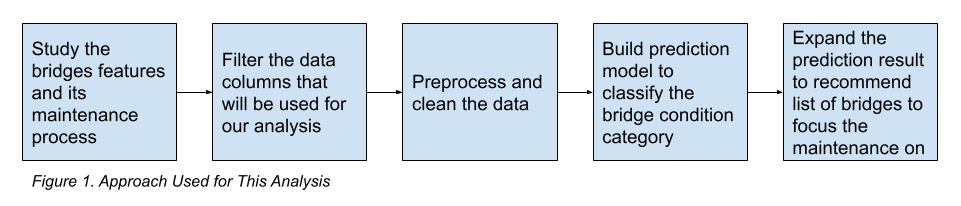

In doing this analysis, we are using the approach like the flowchart above:

### 4.1.1. Background Study: Bridges Features

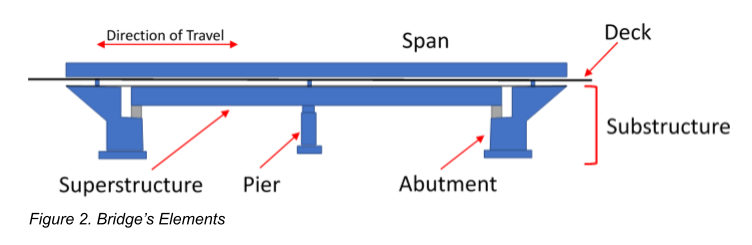

Source: https://civiljungle.com/wp-content/uploads/2020/11/Substructure-Bridge.png

Bridge generally consists of three elements: the substructure, superstructure, and deck of the bridge.
1.   The substructure of a bridge is the component that supports the superstructure and distributes the load to the bridge footings and foundation. They consist of piers, abutments, and wing walls, all of which facilitate transmitting the weight of the load to the earth.
2.   The superstructure bears the weight of the load as it passes through the bridge. It comprises the deck slab, girders, truss, etc. The specific components vary based on the type of bridge and its materials. Not only does the decking hold the load weight, but it also helps transmit the weight and pressure to the below bridge substructures.
3.   The deck is the surface of a bridge where vehicles travel and carry traffic movement from one end to another. They’re generally covered with asphalt, concrete, or some other type of pavement.
 

Source: [Parts of a Bridge Structure](https://azdot.gov/sites/default/files/media/2020/04/Parts-of-a-Bridge-Structure.pdf) and [The Different Components of a Bridge](https://usbridge.com/the-different-components-of-a-bridge/)

In terms of structure, there are so many different structures of bridges, but the most common types in the US are these seven types.

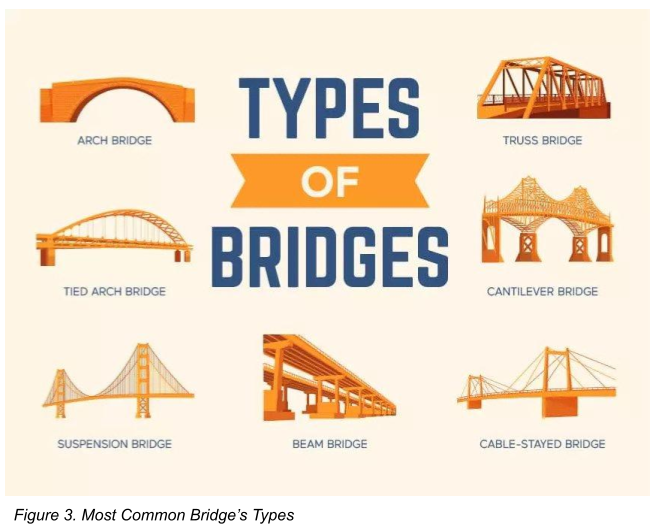

Source: https://www.bigrentz.com/blog/types-of-bridges

Materials for building bridges depend on the type of bridge. However, the most commonly used materials include concrete, steel, stone, and composite.

### 4.1.2. Background Study: Maintance Process

The process map in Figure 4 is the bridge maintenance reference guide defined by PennDOT. The process is presented as a circle because of the continuity of the bridge inspection/maintenance process, which becomes a series of cycles across time. With this analysis result, we provide added value in the Select **Bridge Activities** and **Maintenance Work Order**.

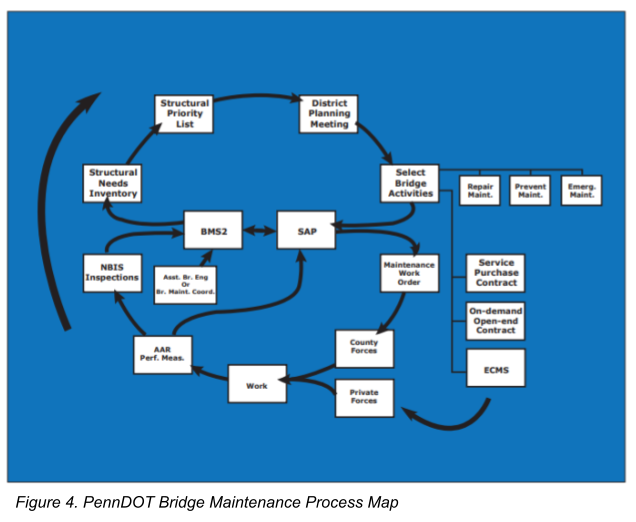

Source: [Bridge Maintenance Manual](https://www.dot.state.pa.us/public/PubsForms/Publications/PUB%2055.pdf)

### 4.1.3. Filter the data columns

After exploring the dataset, reading the data dictionary, and studying the bridge features that affect the bridge's condition, we specify the columns that we will use from each of the datasets. 

From the main dataset, we choose 15 out of 25 columns because the other columns contain information that is not related to the bridge condition, such as BR Key, County, and Municipality, or they contain only missing values, such as Weight Limit Combination and Weight Limit Single.

From the crash dataset, our main focus is to find the number of times a crash happened on a specific bridge. Therefore we only use latitude, longitude, and flag whether the crash hit the bridge or not.

Lastly, from the more comprehensive bridge dataset, our main focus is to get the latitude and longitude data to join the main dataset and crash dataset. Besides that, we include some other features that affect bridge conditions, such as reconstruction year, eligibility for rehabilitation/replacement, reconstruction cost, and transition rating. Therefore, we only chose ten columns out of 173 columns because the rest of them is not correlated to the bridge condition, have to many missing values, or we are not sure what it represents due to limited explanation in the data dictionary.

The list of columns we used for the analysis can be found in the Analysis and Result section.

### 4.1.4. Preprocess the data

To use the data for further analysis, we will preprocess and clean the data first. We will do it with the following steps:

1. Read and merge the dataset to have a final dataset with all necessary columns.
2. Fix the data, including parsing condition rating numbers, calculating bridge age and reconstruction age, handling the rehab/replace data categories, handling missing values, converting data types, and handling duplicates.
3. Create dummies from categorical variables.

In addition to the above preprocessing steps, we also did Exploratory Data Analysis (EDA) to see data distribution to get insight that might be useful to define the pipeline to standardize data, handle imbalance, and impute missing values. 

### 4.1.5. Build the model
We build a model for predicting the classification of the bridge condition category, whether it is Good, Bad, or Fair (supervised learning), with the following steps:

1.   Split the dataset into train and test.
2.   Handle the imbalance category with RandomOverSampler.
3.   Impute missing values by comparing Simple Imputer, KNN Imputer, and MICE Imputer to choose the best result.
3.   Train the training dataset with various candidate models: K Nearest Neighbor, Random Forest, Gradient Boosting, Gaussian Naive Bayes, and Support Vector Machines.
4.   Compare the performance of different models using Accuracy, Confusion Matrix, Precision, Recall, F1 score, ROC, and AUC.
5.   Decide the one with the best performance as the best model for the prediction.

### 4.1.6. Beyond the model: Recommendation of framework to choose bridges to focus the maintenance on

After getting the model and performing the analysis, we explore some bridges in Poor condition. We dig deeper in terms of their location, usage, traffic, maintenance cost, and other related variables to produce a framework that can be used to choose the bridges the government should focus the maintenance on. We also showed examples of how to use that framework. With this framework and example's result as a reference, the government can identify in advance the bridges that need different levels of attention and thus maintenance needs to prevent potential future collapse or other accidents.

## 4.2. Assumptions

**Number of crashes on bridge calculation**: For some bridges that are so close to each other, rounding latitude and longitude coordinates makes them similar in terms of location. Hence when calculating the frequency of crashes on that bridge, we assume that the crash might affect not only the bridge but the area nearby, which is all the bridges close to them, and count effect for all of them.

# 5. Analysis and Result

## 5.1. Read and Merge Dataset

In [1]:
# import necessary libraries
import pandas as pd
import numpy as np
import altair as alt
import seaborn as sns
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings('ignore')

As mentioned above, we use only some of the columns of the dataset. We only use specific columns related to the bridge's conditions, which helps us with the classification model. A detailed explanation of how we choose particular columns instead of others can be found in the **Filter the data columns** section.

In [2]:
# column lists for bridge data
main_columns = ['Condition', 'Bridge Id', 'Owner', 'Length (ft)', 
                'Deck Area (sq ft)', 'Number of Spans', 'Material', 
                'Structure Type', 'Year Built', 'Deck Condition', 
                'Superstructure Condition', 'Substructure Condition', 
                'Culvert Condition', 'Average Daily Traffic',
                'Location/Structure Name']

# column list for crash data
crash_columns = ['DEC_LAT', 'DEC_LONG', 'HIT_BRIDGE']

# column lists for comprehensive bridge data
bridge_columns = ['BRIDGE_ID','DEC_LAT', 'DEC_LONG', 'TRANSRATIN', 'TRUCKPCT', 
                  'HBRR_ELIG', 'YEARRECON', 'NBIIMPCOST', 'NBIRWCOST','NBITOTCOST']

In [3]:
# set path for file upload and reading
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

%cd /content/drive/MyDrive/Portfolio/bridge-risk-classification

Mounted at /content/drive
/content/drive/MyDrive/Portfolio/bridge-risk-classification


In [4]:
# read the file
df_main = pd.read_excel('data/BridgeConditionReport_County-02_2022-11-13.xlsx',
                        usecols=main_columns)
df_crash = pd.read_csv('data/crash_2004-2020.csv', usecols=crash_columns)
df_bridge = pd.read_csv('data/Pennsylvania_Bridges.csv', usecols=bridge_columns)

### 5.1.1. Merge bridge dataset

Merging the main and supporting bridge features datasets is simple because we just need to join them on Bridge ID.

In [5]:
# merge the main and bridge dataset based on Bridge ID
df = df_main.merge(df_bridge, how='left',left_on='Bridge Id', right_on='BRIDGE_ID')

In [6]:
# drop duplicates bridge ID column after merge
df = df.drop(['BRIDGE_ID'], axis=1)

### 5.1.2. Merge crash dataset
When we merge the crash data, we match the crash latitude and longitude with the bridge latitude and longitude by rounding them into two decimals first. Then we count the frequency of crashes on each bridge and merge it into the bridge dataset. We use the assumption mentioned in the **Assumption** section for the calculation.

In [7]:
# filter only the crash that hit bridge
df_crash = df_crash[df_crash['HIT_BRIDGE'] == 1]

# drop HIT_BRIDGE column
df_crash = df_crash.drop(['HIT_BRIDGE'], axis=1)

In [8]:
# check missing value
pd.concat([df_crash.isna().sum(), df_crash.isna().sum()/len(df_crash)*100], axis=1)

,0,1
DEC_LAT,45,6.072874
DEC_LONG,45,6.072874


In [9]:
# since the percentage of missing value is small ~6%, 
# we drop the data with missing latitude and longitude
df_crash = df_crash.dropna()

In [10]:
# data from main dataframe to join with the crash data
col = df[['DEC_LAT','DEC_LONG', 'Bridge Id']]

In [11]:
# round the latitude longitude with two decimal places
df_crash = df_crash.round(2)
col = col.round(2)

In [12]:
# merge crash and col to get qty of crash for each bridges
join = pd.merge(df_crash, col,  
                     on = ['DEC_LAT','DEC_LONG'], 
                     how ='left')

We calculate the number of crashes in the bridges by counting the occurrence frequency based on the merge crash and main dataframe we got previously. We then convert the crash calculation back to the dataframe and join it to the main dataframe.

In [13]:
# convert Bridge ID column to list
c = join['Bridge Id'].tolist()

# get frequency of each Bridge ID
from collections import Counter
counts = Counter(c)

# convert freq count result into list
cl = list(counts.items())

# convert frequency into dataframe
crash_count = pd.DataFrame(cl, columns =['Bridge_ID', 'Crash_Count'])

In [14]:
# join the crash data into main dataset
df = df.merge(crash_count, how='left', left_on='Bridge Id', right_on='Bridge_ID')

# replace NaN in HBRR_ELIG column value to Other
df['Crash_Count'] = df['Crash_Count'].fillna(0)

# change the reconstruction age type into integer
df['Crash_Count'] = df['Crash_Count'].astype(int)

In [15]:
# final df shape
df.shape

(1576, 26)

In [16]:
df.head()

,Condition,Bridge Id,Location/Structure Name,Owner,Length (ft),Deck Area (sq ft),Number of Spans,Material,Structure Type,Year Built,Deck Condition,Superstructure Condition,Substructure Condition,Culvert Condition,Average Daily Traffic,DEC_LAT,DEC_LONG,YEARRECON,HBRR_ELIG,NBIIMPCOST,NBIRWCOST,NBITOTCOST,TRUCKPCT,TRANSRATIN,Bridge_ID,Crash_Count
0,Good,2000803100745,.5 MI. SOUTH OF SR 1010,STATE HIGHWAY AGENCY,46,2916.4,1,Steel,I beams,1931,8 - Very Good,8 - Very Good,7 - Good,N - Not applicable.,20118.0,40.5642,-79.9579,2010.0,NaN,52.0,152.0,697.0,5.0,8,NaN,0
1,Good,2000803601428,1400' NORTH OF MCNEAL RD.,STATE HIGHWAY AGENCY,10,480.0,1,Concrete (cast in place),Arch culvert,1933,N - Not applicable.,N - Not applicable.,N - Not applicable.,7 - Good,21332.0,40.6041,-79.9471,NaN,H,11.0,32.0,146.0,4.0,8,NaN,0
2,Good,2001900100246,AT CIRCLE DRIVE,STATE HIGHWAY AGENCY,20,1340.0,1,Concrete (cast in place),Arch culvert,1940,N - Not applicable.,N - Not applicable.,N - Not applicable.,7 - Good,24309.0,40.3067,-80.0939,0.0,H,12.0,35.0,160.0,2.0,8,NaN,0
3,Good,2300200100000,COUNTRY CLUB RD OVER SR19,STATE HIGHWAY AGENCY,72,2772.0,1,Concrete (cast in place),Rigid frame,1940,7 - Good,7 - Good,7 - Good,N - Not applicable.,673.0,40.3273,-80.0756,2010.0,NaN,21.0,63.0,287.0,8.0,6,NaN,0
4,Good,2001900600000,OVER SR 3004,STATE HIGHWAY AGENCY,77,4427.5,1,Steel,I beams,1940,7 - Good,7 - Good,7 - Good,N - Not applicable.,30714.0,40.3318,-80.0699,1997.0,H,0.0,0.0,0.0,3.0,4,NaN,0


## 5.2. Data Preprocessing

In this part, we preprocess some of the columns as follows:


1.   All conditions/rating columns are on a scale of 1-9 (1 worst and 9 best). However, some of them are concatenated with the description. Thus, we extract only the rating number and change N-not applicable into NaN.
2.   Retrieve the bridge age and reconstruction age, respectively, and drop the original year data.
3. HBRR_ELIG is a column to represent rehabilitation or replacement eligibility. Some are missing; therefore, we assumed them as **Other** status. We didn't do this with the imputation pipeline because it is a fact that we don't know and think it is not supposed to be predicted to fill the missing values.
4. Convert column data types accordingly.
5. Handle duplicates, if any.
6. Create dummies for categorical variables.

### 5.2.1. Parse rating

In [17]:
# get only the numeric value of the conditions data 
# since that's the representation of the condition data
df['Deck Condition'] = df['Deck Condition'].astype(str).str[0]
df['Superstructure Condition'] = df['Superstructure Condition'].astype(str).str[0]
df['Substructure Condition'] = df['Substructure Condition'].astype(str).str[0]
df['Culvert Condition'] = df['Culvert Condition'].astype(str).str[0]

# replace N and n in conditions columns value to NaN
df = df.replace('N', np.NaN)
df = df.replace('n', np.NaN)

### 5.2.2. Retrieve bridge age

In [18]:
# calculate bridge age
df['Age'] = 2022 - df['Year Built']

### 5.2.3. Retrieve bridge construction age

In [19]:
# calculate bridge reconstruction age

# create a list of our conditions
conditions = [
    (df['YEARRECON'].isnull()),
    (df['YEARRECON'] == 0.0),
    (df['YEARRECON'].isnull() == False)
    ]

# create a list of the values we want to assign for each condition
values = [df['Age'], df['Age'], 2022 - df['YEARRECON']]

# create a new column and use np.select 
# to assign values to it using the lists as arguments
df['Reconstruction_Age'] = np.select(conditions, values)

### 5.2.4. Check missing value

In [20]:
# check missing value
mv = pd.concat([df.isna().sum(), df.isna().sum()/len(df)*100], axis=1)
mv[mv[0] != 0]

,0,1
Deck Condition,513,32.550761
Superstructure Condition,428,27.157360
Substructure Condition,428,27.157360
Culvert Condition,1143,72.525381
Average Daily Traffic,396,25.126904
DEC_LAT,1,0.063452
DEC_LONG,1,0.063452
YEARRECON,273,17.322335
HBRR_ELIG,851,53.997462
NBIIMPCOST,263,16.687817


### 5.2.5. Handle HBBR_ELIG column

In [21]:
# replace NaN in HBRR_ELIG column value to Other
df['HBRR_ELIG'] = df['HBRR_ELIG'].fillna('Other Status')

# replace category to be more intuitive
df = df.replace('H', 'Rehab Only')
df = df.replace('P', 'Rehab/Replace')

### 5.2.6. Data type conversion

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1576 entries, 0 to 1575
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Condition                 1576 non-null   object 
 1   Bridge Id                 1576 non-null   int64  
 2   Location/Structure Name   1576 non-null   object 
 3   Owner                     1576 non-null   object 
 4   Length (ft)               1576 non-null   int64  
 5   Deck Area (sq ft)         1576 non-null   float64
 6   Number of Spans           1576 non-null   int64  
 7   Material                  1576 non-null   object 
 8   Structure Type            1576 non-null   object 
 9   Year Built                1576 non-null   int64  
 10  Deck Condition            1063 non-null   object 
 11  Superstructure Condition  1148 non-null   object 
 12  Substructure Condition    1148 non-null   object 
 13  Culvert Condition         433 non-null    object 
 14  Average 

In [23]:
# change the reconstruction age type into integer
df['Reconstruction_Age'] = df['Reconstruction_Age'].astype(int)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1576 entries, 0 to 1575
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Condition                 1576 non-null   object 
 1   Bridge Id                 1576 non-null   int64  
 2   Location/Structure Name   1576 non-null   object 
 3   Owner                     1576 non-null   object 
 4   Length (ft)               1576 non-null   int64  
 5   Deck Area (sq ft)         1576 non-null   float64
 6   Number of Spans           1576 non-null   int64  
 7   Material                  1576 non-null   object 
 8   Structure Type            1576 non-null   object 
 9   Year Built                1576 non-null   int64  
 10  Deck Condition            1063 non-null   object 
 11  Superstructure Condition  1148 non-null   object 
 12  Substructure Condition    1148 non-null   object 
 13  Culvert Condition         433 non-null    object 
 14  Average 

### 5.2.7. Handle duplicates

In [25]:
## check duplicate
dups = df.duplicated()
dups.any()

False

### 5.2.8. Prepare separate dataset for analysis and case study

In [26]:
# drop duplicate bridge ID column
df = df.drop(columns=['Bridge_ID'])

In [27]:
# create a separate dataframe for the case study
df_case_study = df

In [28]:
df_case_study.head()

,Condition,Bridge Id,Location/Structure Name,Owner,Length (ft),Deck Area (sq ft),Number of Spans,Material,Structure Type,Year Built,Deck Condition,Superstructure Condition,Substructure Condition,Culvert Condition,Average Daily Traffic,DEC_LAT,DEC_LONG,YEARRECON,HBRR_ELIG,NBIIMPCOST,NBIRWCOST,NBITOTCOST,TRUCKPCT,TRANSRATIN,Crash_Count,Age,Reconstruction_Age
0,Good,2000803100745,.5 MI. SOUTH OF SR 1010,STATE HIGHWAY AGENCY,46,2916.4,1,Steel,I beams,1931,8,8,7,NaN,20118.0,40.5642,-79.9579,2010.0,Other Status,52.0,152.0,697.0,5.0,8,0,91,12
1,Good,2000803601428,1400' NORTH OF MCNEAL RD.,STATE HIGHWAY AGENCY,10,480.0,1,Concrete (cast in place),Arch culvert,1933,NaN,NaN,NaN,7,21332.0,40.6041,-79.9471,NaN,Rehab Only,11.0,32.0,146.0,4.0,8,0,89,89
2,Good,2001900100246,AT CIRCLE DRIVE,STATE HIGHWAY AGENCY,20,1340.0,1,Concrete (cast in place),Arch culvert,1940,NaN,NaN,NaN,7,24309.0,40.3067,-80.0939,0.0,Rehab Only,12.0,35.0,160.0,2.0,8,0,82,82
3,Good,2300200100000,COUNTRY CLUB RD OVER SR19,STATE HIGHWAY AGENCY,72,2772.0,1,Concrete (cast in place),Rigid frame,1940,7,7,7,NaN,673.0,40.3273,-80.0756,2010.0,Other Status,21.0,63.0,287.0,8.0,6,0,82,12
4,Good,2001900600000,OVER SR 3004,STATE HIGHWAY AGENCY,77,4427.5,1,Steel,I beams,1940,7,7,7,NaN,30714.0,40.3318,-80.0699,1997.0,Rehab Only,0.0,0.0,0.0,3.0,4,0,82,25


In [29]:
# drop unnecessary columns for modelling part
df = df.drop(columns=['Bridge Id','DEC_LAT','DEC_LONG', 'NBIIMPCOST', 
                      'NBIRWCOST', 'NBITOTCOST','YEARRECON', 'Year Built',
                      'Location/Structure Name'])

In [30]:
# final preprocessed dataset for modelling
df.head()

,Condition,Owner,Length (ft),Deck Area (sq ft),Number of Spans,Material,Structure Type,Deck Condition,Superstructure Condition,Substructure Condition,Culvert Condition,Average Daily Traffic,HBRR_ELIG,TRUCKPCT,TRANSRATIN,Crash_Count,Age,Reconstruction_Age
0,Good,STATE HIGHWAY AGENCY,46,2916.4,1,Steel,I beams,8,8,7,NaN,20118.0,Other Status,5.0,8,0,91,12
1,Good,STATE HIGHWAY AGENCY,10,480.0,1,Concrete (cast in place),Arch culvert,NaN,NaN,NaN,7,21332.0,Rehab Only,4.0,8,0,89,89
2,Good,STATE HIGHWAY AGENCY,20,1340.0,1,Concrete (cast in place),Arch culvert,NaN,NaN,NaN,7,24309.0,Rehab Only,2.0,8,0,82,82
3,Good,STATE HIGHWAY AGENCY,72,2772.0,1,Concrete (cast in place),Rigid frame,7,7,7,NaN,673.0,Other Status,8.0,6,0,82,12
4,Good,STATE HIGHWAY AGENCY,77,4427.5,1,Steel,I beams,7,7,7,NaN,30714.0,Rehab Only,3.0,4,0,82,25


### 5.2.9. Create dummies
In this part, we create dummies for all categorical variables: HBRR_ELIG, Owner, Material, and Structure Type.

In [31]:
# create dummies for HBRR_ELIG variables
dummies = pd.get_dummies(df.HBRR_ELIG)
new_df = pd.concat([df, dummies], axis='columns')
new_df = new_df.drop(['HBRR_ELIG'], axis='columns')

In [32]:
# create dummies for Owner variables
dummies = pd.get_dummies(df.Owner)
new_df = pd.concat([new_df, dummies], axis='columns')
new_df = new_df.drop(['Owner'], axis='columns')

In [33]:
# create dummies for Material variables
dummies = pd.get_dummies(df.Material)
new_df = pd.concat([new_df, dummies], axis='columns')
new_df = new_df.drop(['Material'], axis='columns')

In [34]:
# create dummies for Structure Type variables
dummies = pd.get_dummies(df['Structure Type'])
new_df = pd.concat([new_df, dummies], axis='columns')
new_df = new_df.drop(['Structure Type'], axis='columns')

In [35]:
# final preprocessed dataset with dummies variables
new_df.head()

,Condition,Length (ft),Deck Area (sq ft),Number of Spans,Deck Condition,Superstructure Condition,Substructure Condition,Culvert Condition,Average Daily Traffic,TRUCKPCT,TRANSRATIN,Crash_Count,Age,Reconstruction_Age,Other Status,Rehab Only,Rehab/Replace,"CITY, MUNICIPAL, HIGHWAY AGENCY, OR BOROUGH",COUNTY HIGHWAY AGENCY,OTHER LOCAL AGENCIES,RAILROAD,STATE HIGHWAY AGENCY,TOWN OR TOWNSHIP HIGHWAY AGENCY,"Aluminum, wrought iron, cast iron",Concrete (cast in place),Concrete (precast),Concrete encased steel,Masonry,Other,Prestressed precast concrete (P/S),Steel,Timber,Arch - thru,Arch culvert,Arch deck - closed,Arch deck - open,Box beam - (spread),Box beam - adj,Box beam - single,Box culvert,Channel beams,Frame culvert,Girder rbr/deck,Girder riv/deck,Girder riv/thru,Girder weld/deck,Girder weld/thru,Glue-lam timber,I beams,I-riveted beams,I-welded beams,Other,Pipe culvert,Pipe-arch culvert,Rigid frame,Slab (solid),Suspension,T-beams,Tied arch culvert,Truss - deck,Truss - thru
0,Good,46,2916.4,1,8,8,7,NaN,20118.0,5.0,8,0,91,12,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,Good,10,480.0,1,NaN,NaN,NaN,7,21332.0,4.0,8,0,89,89,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Good,20,1340.0,1,NaN,NaN,NaN,7,24309.0,2.0,8,0,82,82,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Good,72,2772.0,1,7,7,7,NaN,673.0,8.0,6,0,82,12,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,Good,77,4427.5,1,7,7,7,NaN,30714.0,3.0,4,0,82,25,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


## 5.3. Exploratory Data Analysis
In this part, we do some visualization to see the data distribution. This way, we get insight that might be useful to define the pipeline to standardize data, handle imbalance, and impute missing values.

### 5.3.1. Distribution of numerical values features

Result: We can see from the charts below that most of the columns with numerical values has a right-skewed distribution with a lump of data at the start followed by a long tail.

In [36]:
# histogram length of bridge
alt.Chart(df).mark_bar().encode(
    alt.X("Length (ft):Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [37]:
# histogram deck area of bridge
alt.Chart(df).mark_bar().encode(
    alt.X("Deck Area (sq ft):Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [38]:
# histogram number of spans of bridge
alt.Chart(df).mark_bar().encode(
    alt.X("Number of Spans:Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [39]:
# histogram age of bridge
alt.Chart(df).mark_bar().encode(
    alt.X("Age:Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [40]:
# histogram reconstruction age of bridge
alt.Chart(df).mark_bar().encode(
    alt.X("Reconstruction_Age:Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [41]:
# histogram avg daily traffic of bridge
alt.Chart(df).mark_bar().encode(
    alt.X("Average Daily Traffic:Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [42]:
# histogram average daily truck traffic percent of bridge
alt.Chart(df).mark_bar().encode(
    alt.X("TRUCKPCT:Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [43]:
# histogram crash count of bridge
alt.Chart(df).mark_bar().encode(
    alt.X("Crash_Count:Q", bin=True),
    y='count()',
)

alt.Chart(...)

### 5.3.2. Distribution of categorical values features

Result:

1.   The dataset is imbalanced with bridges with Fair conditions dominating about 49% of the data. Hence we will need to do sampling to ensure better prediction results.
2.   All the bridge's feature rating data are shaped like normal Distribution, with the most common rating being 6 or 7. Therefore when we standardize the value, we will use StandardScaler, which follows normal Distribution.
3.   Transition rating's most common value is 8, which means that the bridge condition is equal to the present desirable criteria.
4.   The most popular material of the bridge is steel and concrete, which is aligned with the background study we conducted.
5.   The most popular material of the bridge is I beams, Box culvert, and I-welded beams, which is aligned with the background study we conducted.

In [44]:
# barchart of deck condition rating
group = df.groupby(['Deck Condition'])['Deck Condition'].count().reset_index(
    name='TotalBridge')

alt.Chart(group).mark_bar().encode(
    x='Deck Condition:O',
    y='TotalBridge:Q'
)

alt.Chart(...)

In [45]:
# barchart of superstructure condition rating
group = df.groupby(['Superstructure Condition'])[
    'Superstructure Condition'].count().reset_index(name='TotalBridge')

alt.Chart(group).mark_bar().encode(
    x='Superstructure Condition:O',
    y='TotalBridge:Q'
)

alt.Chart(...)

In [46]:
# barchart of substructure condition rating
group = df.groupby(['Substructure Condition'])[
    'Substructure Condition'].count().reset_index(name='TotalBridge')

alt.Chart(group).mark_bar().encode(
    x='Substructure Condition:O',
    y='TotalBridge:Q'
)

alt.Chart(...)

In [47]:
# barchart of culvert condition rating
group = df.groupby(['Culvert Condition'])[
    'Culvert Condition'].count().reset_index(name='TotalBridge')

alt.Chart(group).mark_bar().encode(
    x='Culvert Condition:O',
    y='TotalBridge:Q'
)

alt.Chart(...)

In [48]:
# barchart of transition rating
group = df.groupby(['TRANSRATIN'])['TRANSRATIN'].count().reset_index(
    name='TotalBridge')

alt.Chart(group).mark_bar().encode(
    x='TRANSRATIN:O',
    y='TotalBridge:Q'
)

alt.Chart(...)

In [49]:
# barchart of bridge material
group = df.groupby(['Material'])['Material'].count().reset_index(name='TotalBridge')

alt.Chart(group).mark_bar().encode(
              y=alt.Y('Material:N', sort='-x'),
              x=alt.X('TotalBridge:Q'),
              color=alt.Color('TotalBridge:Q'),
              tooltip=[
                      alt.Tooltip('Material:N', title='Material'),
                      alt.Tooltip('TotalBridge:Q', title='#Bridge', format=",")
              ]
          ).transform_window(
              rank='rank(TotalBridge)',
              sort=[alt.SortField('TotalBridge', order='descending')]
          ).properties(
              title = 'Bridge Material Distribution',
          )

alt.Chart(...)

In [50]:
# barchart of bridge structure type
group = df.groupby(['Structure Type'])[
    'Structure Type'].count().reset_index(name='TotalBridge')

alt.Chart(group).mark_bar().encode(
              y=alt.Y('Structure Type:N', sort='-x'),
              x=alt.X('TotalBridge:Q'),
              color=alt.Color('TotalBridge:Q'),
              tooltip=[
                      alt.Tooltip('Structure Type:N', title='Structure Type'),
                      alt.Tooltip('TotalBridge:Q', title='#Bridge', format=",")
              ]
          ).transform_window(
              rank='rank(TotalBridge)',
              sort=[alt.SortField('TotalBridge', order='descending')]
          ).properties(
              title = 'Bridge Structure Type Distribution',
          )

alt.Chart(...)

In [51]:
# barchart of bridge condition
group = df.groupby(['Condition'])['Condition'].count().reset_index(name='TotalBridge')

alt.Chart(group).mark_bar().encode(
    x='TotalBridge:Q',
    y='Condition:O',
    color='Condition'
)

alt.Chart(...)

### 5.3.3. Features Correlations

Result:


1.   There is a positive correlation between the bridge's length with the deck area and the number of spans, which is aligned with the background study result.
2.   There is a slightly positive correlation between age and reconstruction age that makes sense: older bridge has a worse condition, hence needs reconstruction.
3.   Since no other features are so correlated to each other that they can be represented only by one, we keep all these for the analysis.

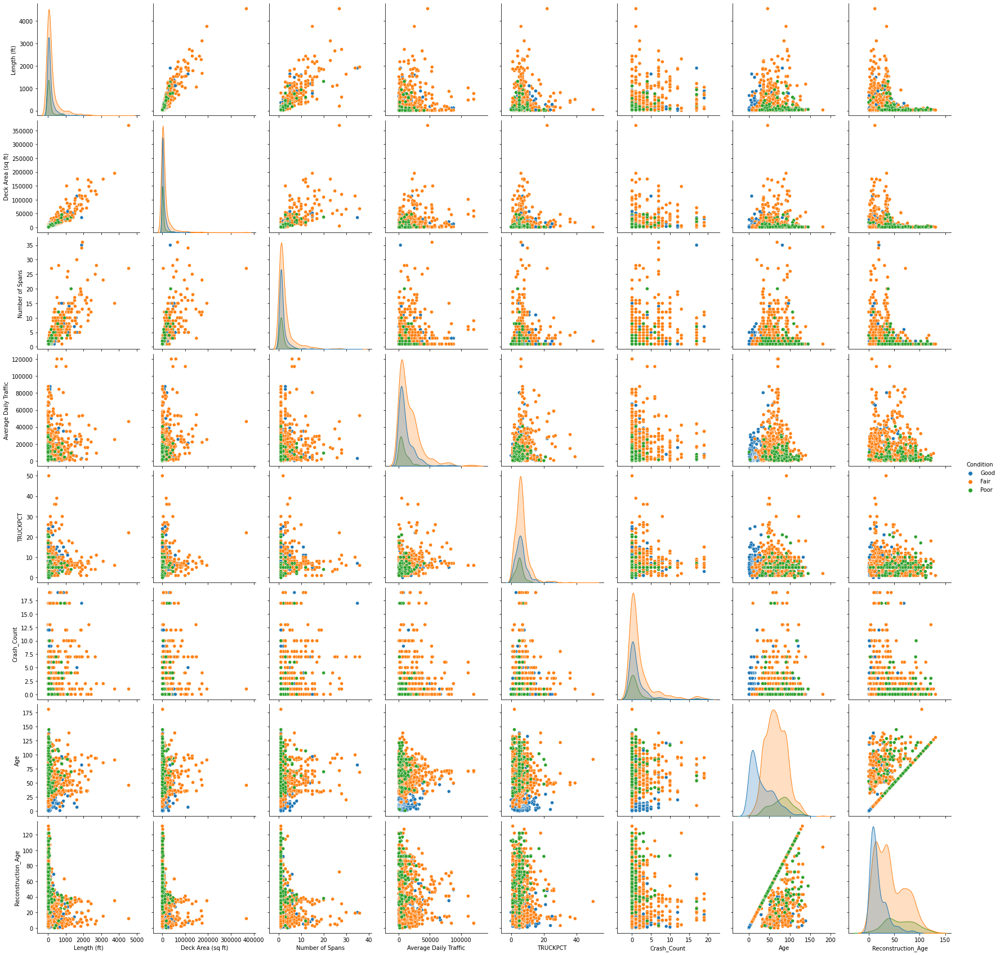

In [52]:
# check correlation between features
sns.pairplot(df, hue='Condition', size=3)

## 5.4. Pipeline: Imputation & Scaling

As mentioned above, we need to handle imbalanced data, impute missing values, and standardize data to make them comparable. To do so, we run sampling with RandomOverSampler after separating training and test data. After that, we do imputation and scaling through a pipeline to ensure no data leakage.

1. Imputation
    - Categorical variables: `Deck Condition`, `Superstructure Condition`, `Substructure Condition.`
      - Simple Imputer - `most_frequent.`
        - We chose this strategy because it is the go-to imputation method for categorical variables
    - Numerical variables: `Average Daily Traffic`, `TRUCKPCT`, `TRANSRATIN.`
      - SimpleImputer: we try different strategies - mean, median, most_frequent
      - KNN Imputer
      - Iterative Imputer
            
2. Scaling
    - Standard Scaler
      - We chose Standard Scaler instead of MinMax Scaler because we want to transform the skewed distribution of our features (refer to the EDA plots) to a normal distribution and reduce the impact from outliers. Also, we don't need to confine the data within the range of [0,1]

In [53]:
# handle class imbalance
from imblearn.over_sampling import RandomOverSampler 

# library for Imputation & Standardization
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler

# library for train-test split & cross validation
from sklearn.model_selection import train_test_split,cross_val_score,\
                              RepeatedStratifiedKFold

# model to test imputation methods
from sklearn.neighbors import KNeighborsClassifier

In [54]:
# check missing value
mv = pd.concat([new_df.isna().sum(), new_df.isna().sum()/len(new_df)*100], axis=1)
mv[mv[0] != 0]

,0,1
Deck Condition,513,32.550761
Superstructure Condition,428,27.157360
Substructure Condition,428,27.157360
Culvert Condition,1143,72.525381
Average Daily Traffic,396,25.126904
TRUCKPCT,6,0.380711
TRANSRATIN,18,1.142132


Since the proportion of missing values of `Culvert Condition` is as high as ~72.6%, the imputation of this column based on less than 30% of total information can be problematic, and we decided to drop this variable.

In [55]:
# drop culvert condition
new_df = new_df.drop(columns = ['Culvert Condition'])
new_df.head()

,Condition,Length (ft),Deck Area (sq ft),Number of Spans,Deck Condition,Superstructure Condition,Substructure Condition,Average Daily Traffic,TRUCKPCT,TRANSRATIN,Crash_Count,Age,Reconstruction_Age,Other Status,Rehab Only,Rehab/Replace,"CITY, MUNICIPAL, HIGHWAY AGENCY, OR BOROUGH",COUNTY HIGHWAY AGENCY,OTHER LOCAL AGENCIES,RAILROAD,STATE HIGHWAY AGENCY,TOWN OR TOWNSHIP HIGHWAY AGENCY,"Aluminum, wrought iron, cast iron",Concrete (cast in place),Concrete (precast),Concrete encased steel,Masonry,Other,Prestressed precast concrete (P/S),Steel,Timber,Arch - thru,Arch culvert,Arch deck - closed,Arch deck - open,Box beam - (spread),Box beam - adj,Box beam - single,Box culvert,Channel beams,Frame culvert,Girder rbr/deck,Girder riv/deck,Girder riv/thru,Girder weld/deck,Girder weld/thru,Glue-lam timber,I beams,I-riveted beams,I-welded beams,Other,Pipe culvert,Pipe-arch culvert,Rigid frame,Slab (solid),Suspension,T-beams,Tied arch culvert,Truss - deck,Truss - thru
0,Good,46,2916.4,1,8,8,7,20118.0,5.0,8,0,91,12,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,Good,10,480.0,1,NaN,NaN,NaN,21332.0,4.0,8,0,89,89,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Good,20,1340.0,1,NaN,NaN,NaN,24309.0,2.0,8,0,82,82,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Good,72,2772.0,1,7,7,7,673.0,8.0,6,0,82,12,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,Good,77,4427.5,1,7,7,7,30714.0,3.0,4,0,82,25,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [56]:
# separate features and target
target = 'Condition'
features = list(new_df.columns)
features.remove(target)

X = new_df[features]
y = new_df[target]

# separate train and test dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=0)

In [57]:
# check whether three classes are balanced in the training dataset
df_class_imbalance = pd.concat([y_train.value_counts(),
                                y_train.value_counts()/len(df)*100], axis=1)
df_class_imbalance.columns = ['count', 'percentage']
df_class_imbalance

,count,percentage
Fair,781,49.555838
Good,342,21.700508
Poor,137,8.692893


Based on the results above and align with the EDA result, the three condition classes are not balanced. Thus, we will do oversampling to achieve class balance.

In [58]:
# oversampling
ros = RandomOverSampler(random_state=0)
X_train, y_train = ros.fit_resample(np.array(X_train), y_train)
X_train = pd.DataFrame(X_train, columns=X.columns)
df_class_balance = pd.concat([y_train.value_counts(), 
                              y_train.value_counts()/len(df)*100], axis=1)
df_class_balance.columns = ['count', 'percentage']
df_class_balance

,count,percentage
Fair,781,49.555838
Good,781,49.555838
Poor,781,49.555838


Now all three classes are balanced, and we can start imputation and scaling. 

In [59]:
# define categorical features and transformer
categorical_features = ['Deck Condition', 'Superstructure Condition',
                        'Substructure Condition']
categorical_transformer = SimpleImputer(strategy='most_frequent')

# define numerical features
numeric_features = ['Average Daily Traffic', 'TRUCKPCT', 'TRANSRATIN']

# define model to test imputation methods
model = KNeighborsClassifier()

### 5.4.1. Simple Imputer

In [60]:
# try different strategies with simple imputer 
results=[]
strategies = ['mean', 'median', 'most_frequent']

# loop over different simple imputer strategy
for s in strategies:
    numeric_transformer = SimpleImputer(strategy=s)

    # construct column transformer for categorical and numerical features
    imp = ColumnTransformer(
            transformers = [
                ("cat_impute", categorical_transformer, categorical_features),
                ("numeric_impute", numeric_transformer, numeric_features)],
                remainder='passthrough')
    
    # build pipeline for imputation and scaling
    pipeline = Pipeline(
        steps=[("preprocessor", imp), ("scaler",StandardScaler())])
    
    # apply the pipeline to training data
    X_train_processed = pd.DataFrame(
        pipeline.fit_transform(X_train),
        columns=categorical_features+numeric_features +\
        [col for col in X_train.columns if col not in \
         categorical_features+numeric_features])
    
    # evaluate the model
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X_train_processed, y_train, 
                             scoring='accuracy', cv=cv, n_jobs=-1)
    
    # store results
    results.append(scores)
    print('%20s %.3f (%.3f)' % (s, scores.mean(), scores.std()))

                mean 0.842 (0.023)
              median 0.843 (0.024)
       most_frequent 0.843 (0.024)


### 5.4.2. KNN Imputer

In [61]:
results = []
nbrhood_size = [1,3,5,7,9,15,18,21]

# loop over different neighborhood size
for k in nbrhood_size:
    numeric_transformer = KNNImputer(n_neighbors=k)

    # construct column transformer for categorical and numerical features
    imp = ColumnTransformer(
            transformers = [
                ("cat_impute",categorical_transformer,categorical_features),
                ("numeric_impute",numeric_transformer, numeric_features)],
                remainder='passthrough')
    
    # build pipeline for imputation and scaling
    pipeline = Pipeline(
        steps=[("preprocessor", imp),("scaler", StandardScaler())])
    
    # apply the pipeline to training data
    X_train_processed = pd.DataFrame(
        pipeline.fit_transform(X_train),
        columns=categorical_features+numeric_features +\
        [col for col in X_train.columns if col not in \
         categorical_features+numeric_features])
    
    # evaluate the model
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X_train_processed, y_train,
                             scoring='accuracy', cv=cv, n_jobs=-1)
    
    # store results
    results.append(scores)
    print('k=%3d %.3f (%.3f)' % (k, scores.mean(), scores.std()))

k=  1 0.844 (0.023)
k=  3 0.845 (0.022)
k=  5 0.844 (0.022)
k=  7 0.843 (0.022)
k=  9 0.844 (0.022)
k= 15 0.843 (0.022)
k= 18 0.844 (0.022)
k= 21 0.842 (0.022)


### 5.4.3. MICE / Iterative Imputer


In [62]:
# build iterative imputer
numeric_transformer =IterativeImputer(random_state=0)

# construct column transformer for categorical and numerical features
imp = ColumnTransformer(
        transformers = [
            ("cat_impute",categorical_transformer,categorical_features),
            ("numeric_impute",numeric_transformer, numeric_features)],
            remainder='passthrough')

# build pipeline for imputation and scaling
pipeline = Pipeline(
    steps=[("preprocessor", imp),("scaler",StandardScaler())])

# apply the pipeline to training data
X_train_processed = pd.DataFrame(
    pipeline.fit_transform(X_train),
    columns=categorical_features+numeric_features +\
    [col for col in X_train.columns if col not in \
     categorical_features+numeric_features])

# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model, X_train_processed, y_train, 
                         scoring='accuracy', cv=cv, n_jobs=-1)
print('Mean Accuracy: %.3f (%.3f)' % (scores.mean(), scores.std()))

Mean Accuracy: 0.842 (0.023)


Above, we provided different evaluation results with varying methods of imputation using the K-Nearest Neighbor Classifier as an example. We also tried other models, including Gaussian Naive Bayes, SVM, Random Forest, and Gradient Boosting, with the same process. The results via all imputation methods are similar for each model.

Therefore, we would pick one of the imputation methods, and we decided to go with the MICE Imputer due to its flexibility compared to other imputation methods.

In [63]:
# build iterative imputer
numeric_transformer =IterativeImputer(random_state=0)

# construct column transformer for categorical and numerical features
imp = ColumnTransformer(
        transformers = [("cat_impute",categorical_transformer,categorical_features),
                        ("numeric_impute",numeric_transformer, numeric_features)],
                        remainder='passthrough')

# build pipeline for imputation and scaling
pipeline = Pipeline(
    steps=[("preprocessor", imp),("scaler",StandardScaler())])

# apply the pipeline to training data
X_train_processed = pd.DataFrame(
    pipeline.fit_transform(X_train),
    index=X_train.index,
    columns=categorical_features+numeric_features +\
    [col for col in X_train.columns if col not in \
     categorical_features+numeric_features])

# apply the pipeline to training data
X_test_processed = pd.DataFrame(
    pipeline.fit_transform(X_test),
    index=X_test.index,
    columns=categorical_features+numeric_features +\
    [col for col in X_test.columns if col not in \
     categorical_features+numeric_features])


## 5.5. Model Training
We train the data to these five classification models to choose the one that performs the best.
- K-Nearest Neighbors
  - Suitable for classification tasks
  - Simple and intuitive
  - Inherently multiclass
- Gaussian Naive Bayes
  - Suitable for classification tasks
  - Efficient and not biased by outliers
  - Inherently multiclass
- Support Vector Machine 
  - Effective in high-dimensional spaces
  - Performs and generalizes well on the out-of-sample data
  - Can handle multiclass classification tasks 
- Random Forest 
  - Powerful and accurate
  - Support multiclass-multioutput
- Gradient Boosting 
  - Enables a more complex ensemble
  - Support multiclass-multioutput

In [64]:
# libraries for modelling
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

# libraries for model Evaluation
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay,\
                            classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc

# libraries for the plot
from matplotlib import pyplot as plt

In [65]:
# define cross validation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)  

### 5.5.1. KNN

In [66]:
# tuning parameter k
# create holder for cv scores
knn_scores = {}

# create KNN model object
knn = KNeighborsClassifier()

# loop over k from 1 to 29
for i in range(1,30):
    knn.set_params(n_neighbors=i)

    # get cv scores for each k and store it
    scores = np.mean(cross_val_score(knn, X_train_processed, y_train,cv=cv,scoring='accuracy'))
    knn_scores[i] = scores
    
# choose the best k by maximum cv accuracy
k_best = max(knn_scores, key=knn_scores.get)

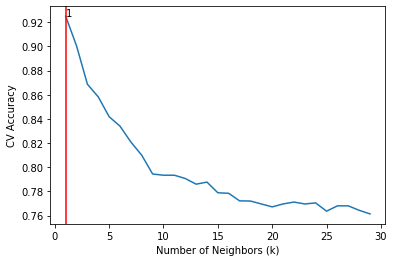

In [67]:
# plot CV accuracy vs Number of neighbors
plt.plot(range(1,30),[val for i,val in knn_scores.items()])
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("CV Accuracy")
plt.axvline(x = k_best,color='r')
plt.text(x=k_best,y=max([i for k,i in knn_scores.items()]),s=k_best)
plt.show()

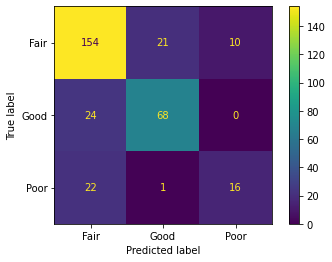

In [68]:
# refit the KNN model with best k = 1
knn = KNeighborsClassifier(n_neighbors=k_best).fit(X_train_processed, y_train)

# get predicted target value
knn_pred = knn.predict(X_test_processed)

# generate and plot confusion matrix
cm_knn_best = confusion_matrix(y_test,knn_pred)
display_cm = ConfusionMatrixDisplay(confusion_matrix=cm_knn_best, display_labels=['Fair','Good','Poor'])
display_cm.plot()

In [69]:
print(classification_report(y_test, knn_pred, digits=3))

              precision    recall  f1-score   support

        Fair      0.770     0.832     0.800       185
        Good      0.756     0.739     0.747        92
        Poor      0.615     0.410     0.492        39

    accuracy                          0.753       316
   macro avg      0.714     0.661     0.680       316
weighted avg      0.747     0.753     0.747       316



### 5.5.2. Gaussian Naive Bayes

In [70]:
# create Naive Bayes Model
NB = GaussianNB()

# hyperparameter tuining
params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=NB, 
                 param_grid=params_NB,  
                 verbose=1, 
                 cv = cv,
                 scoring='accuracy') 
gs_NB.fit(X_train_processed, y_train)

# get best parameters
gs_NB.best_params_

Fitting 30 folds for each of 100 candidates, totalling 3000 fits


{'var_smoothing': 0.0657933224657568}

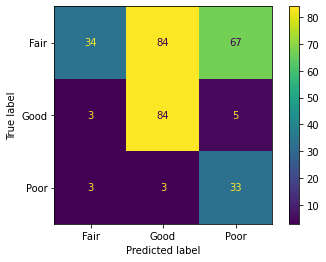

In [71]:
# set Naive Bayes classifier with best hyparameters
NB = GaussianNB(var_smoothing= 0.0657933224657568)

# fit the classifier using training data
NB.fit(X_train_processed, y_train)

# predict target using the model fit
NB_pred = NB.predict(X_test_processed)

# generate and plot confusion matrix
cm_NB = confusion_matrix(y_test, NB_pred)
display_cm_NB = ConfusionMatrixDisplay(confusion_matrix = cm_NB,
                                       display_labels=['Fair','Good','Poor'])
display_cm_NB.plot()

In [72]:
print(classification_report(y_test, NB_pred, digits=3))

              precision    recall  f1-score   support

        Fair      0.850     0.184     0.302       185
        Good      0.491     0.913     0.639        92
        Poor      0.314     0.846     0.458        39

    accuracy                          0.478       316
   macro avg      0.552     0.648     0.466       316
weighted avg      0.679     0.478     0.419       316



### 5.5.3. Support Vector Machine

In [73]:
%%time
# hyper parameter tuning for SVM classifier
param_grid = {'C': np.logspace(-1, 1, 3), 
              'gamma': np.logspace(-1, 1, 3),
              'kernel': ['linear','rbf']} 
svm_gs = GridSearchCV(svm.SVC(probability=True), 
                      param_grid, cv = cv, scoring='accuracy', verbose = 0)
  
# fitting the model for grid search
svm_gs.fit(X_train_processed, y_train)

# get best parameters
svm_gs.best_params_

CPU times: user 15min 59s, sys: 1.17 s, total: 16min
Wall time: 15min 56s


{'C': 10.0, 'gamma': 1.0, 'kernel': 'rbf'}

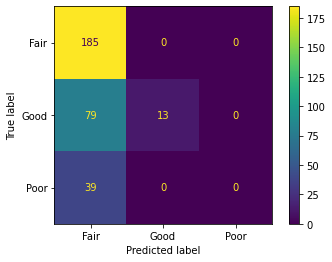

In [74]:
# refit the SVM model using the best hyperparameters
svm_clf = svm.SVC(C = 10.0, gamma = 1.0, kernel = 'rbf',probability=True)
svm_clf.fit(X_train_processed, y_train)
svm_pred = svm_clf.predict(X_test_processed)

# generate and plot confusion matrix
cm_svm = confusion_matrix(y_test, svm_pred)
display_cm_svm = ConfusionMatrixDisplay(confusion_matrix = cm_svm, 
                                        display_labels=['Fair','Good','Poor'])

display_cm_svm.plot()    

In [75]:
print(classification_report(y_test, svm_pred, digits=3))

              precision    recall  f1-score   support

        Fair      0.611     1.000     0.758       185
        Good      1.000     0.141     0.248        92
        Poor      0.000     0.000     0.000        39

    accuracy                          0.627       316
   macro avg      0.537     0.380     0.335       316
weighted avg      0.649     0.627     0.516       316



### 5.5.4. Random Forest 

In [76]:
%%time
# create random forest object
rf = RandomForestClassifier(random_state=0)

# use GridSearchCV to tune hyperparameter for random forest
# here we include max_features = None for include bagging as one potential model
rf_gs = GridSearchCV(rf,param_grid={'n_estimators':range(500,1001, 100),
                                    'max_features':[None,'sqrt','log2']},
                    cv = cv, scoring='accuracy') 
rf_gs.fit(X_train_processed, y_train)

# get the best hyperparameters
rf_gs.best_params_

CPU times: user 32min 17s, sys: 7.12 s, total: 32min 24s
Wall time: 32min 28s


{'max_features': 'sqrt', 'n_estimators': 900}

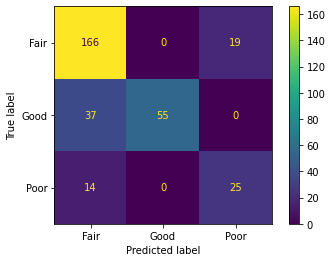

In [77]:
# refit the random forest model using the best hyperparameters
rf = RandomForestClassifier(max_features = 'sqrt', n_estimators = 900,
                            random_state=0)
rf.fit(X_train_processed, y_train)
rf_pred = rf.predict(X_test_processed)

# generate and plot confusion matrix
cm_rf = confusion_matrix(y_test, rf_pred)
display_cm_rf = ConfusionMatrixDisplay(confusion_matrix = cm_rf, display_labels=['Fair','Good','Poor'])

display_cm_rf.plot()   

In [78]:
print(classification_report(y_test, rf_pred, digits=3))

              precision    recall  f1-score   support

        Fair      0.765     0.897     0.826       185
        Good      1.000     0.598     0.748        92
        Poor      0.568     0.641     0.602        39

    accuracy                          0.778       316
   macro avg      0.778     0.712     0.726       316
weighted avg      0.809     0.778     0.776       316



### 5.5.5. Gradient Boosting

In [79]:
%%time
# create gradient boosting classifier object
gb_clf = GradientBoostingClassifier(random_state=0)

# use GridSearchCV to tune hyperparameter for gradient boosting
params = {'n_estimators':[100,500], 'learning_rate':[0.05, 0.1]}
gb_gs = GridSearchCV(gb_clf, param_grid=params,cv = cv, scoring='accuracy')
gb_gs.fit(X_train_processed, y_train)

# get the best parameters
gb_gs.best_params_

CPU times: user 10min 30s, sys: 1.19 s, total: 10min 31s
Wall time: 10min 31s


{'learning_rate': 0.1, 'n_estimators': 500}

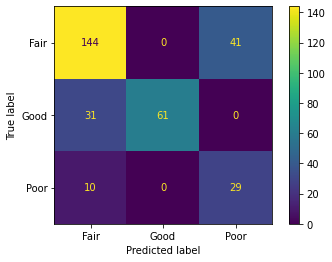

In [80]:
# refit the gradient boosting classifier using best parameters
gb_clf = GradientBoostingClassifier(learning_rate= 0.1, n_estimators= 500)
gb_clf.fit(X_train_processed, y_train)
gb_pred = gb_clf.predict(X_test_processed)

# generate and plot confusion matrix
cm_gb = confusion_matrix(y_test, gb_pred)
display_cm_gb = ConfusionMatrixDisplay(confusion_matrix = cm_gb, 
                                       display_labels=['Fair','Good','Poor'])
display_cm_gb.plot() 

In [81]:
print(classification_report(y_test, gb_pred, digits=3))

              precision    recall  f1-score   support

        Fair      0.778     0.778     0.778       185
        Good      1.000     0.663     0.797        92
        Poor      0.414     0.744     0.532        39

    accuracy                          0.741       316
   macro avg      0.731     0.728     0.703       316
weighted avg      0.798     0.741     0.754       316



## 5.6. Model Evaluation

In [82]:
# library for one vs rest AUC calculation
from sklearn.preprocessing import OneHotEncoder

In [83]:
# convert test target to binary for one vs rest AUC calculation
y_test_ohe = OneHotEncoder().fit_transform(np.array(y_test).reshape(-1,1)).toarray()

# calculate the one vs rest AUC for all five models
print('1. kNN:\nAUC = ', roc_auc_score(y_test_ohe, 
                                       knn.predict_proba(X_test_processed), 
                                       multi_class='ovr'),'\n')
print('2. Naive Bayes:\nAUC = ', roc_auc_score(y_test_ohe, 
                                               NB.predict_proba(X_test_processed), 
                                               multi_class='ovr'),'\n')
print('3. SVM:\nAUC = ', roc_auc_score(y_test_ohe, 
                                               svm_clf.predict_proba(X_test_processed), 
                                               multi_class='ovr'),'\n')
print('4. Random Forest:\nAUC = ', roc_auc_score(y_test_ohe, 
                                                 rf.predict_proba(X_test_processed), 
                                                 multi_class='ovr'),'\n')
print('5. Gradient Boosting:\nAUC = ', roc_auc_score(y_test_ohe, 
                                         gb_clf.predict_proba(X_test_processed), 
                                         multi_class='ovr'),'\n')

1. kNN:
AUC =  0.7493931450927893 

2. Naive Bayes:
AUC =  0.8230951891443459 

3. SVM:
AUC =  0.7592844875022958 

4. Random Forest:
AUC =  0.9186705001329876 

5. Gradient Boosting:
AUC =  0.845530446767651 



We evaluate the four multiclass classification models above first using the one-vs-rest AUC. "As a rule of thumb, an AUC above 0.85 means high classification accuracy, one between 0.75 and 0.85 means moderate accuracy, and one less than 0.75 means low accuracy" (D' Agostino, Rodgers, & Mauck, 2018).

Based on the results, Random Forest has the highest AUC of ~0.92. But since we have three classes (Good, Fair, and Poor), we would also like to see what each model's ROC curve looks like.

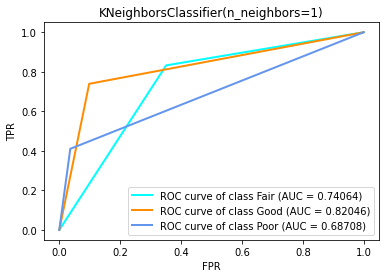

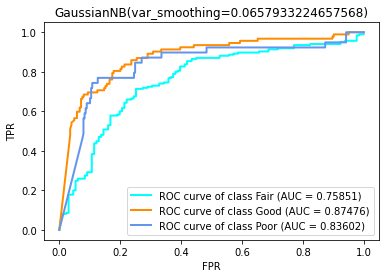

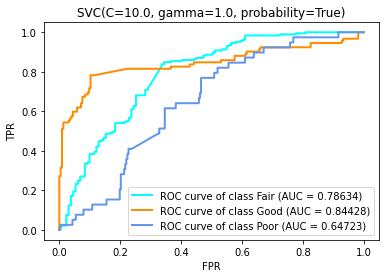

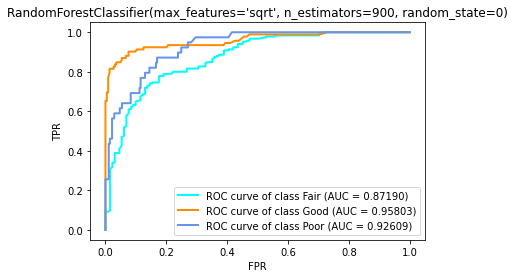

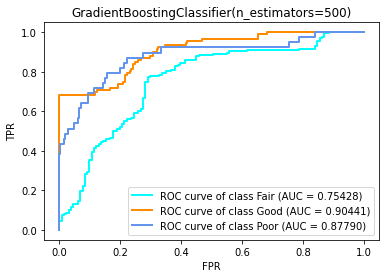

In [84]:
# plot the AUC ROC curve for all three classes for all five models
for model in [knn,NB,svm_clf,rf,gb_clf]:
    probs = model.predict_proba(X_test_processed)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    # compute ROC curve and ROC area for each class
    for i in range(3):
        fpr[i], tpr[i], _ = roc_curve(y_test_ohe[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    colors = ["aqua", "darkorange", "cornflowerblue"]

    for (i,label,color) in zip(range(3),['Fair','Good','Poor'],colors):
        plt.plot(
            fpr[i],
            tpr[i],
            color = color,
            lw=2,
            label=f'ROC curve of class {label} (AUC = {roc_auc[i]:0.5f})'
        )

    plt.legend(loc="lower right")
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title(f'{model}')
    plt.show()

Based on the plots above, we observe that Random Forest still has the highest AUC for all three classes (Fair: 0.8719, Good: 0.95803, Poor: 0.92609) among all models. The three ROC curves also stay closer to the top left corner the most. 

Among the five classification models, the Random Forest model yields the highest one-over-rest AUC and also the highest AUC for all three classes, all above 0.85. It is considered to have high accuracy, so we picked it as the best model.

### 5.6.1. Best Model Performance

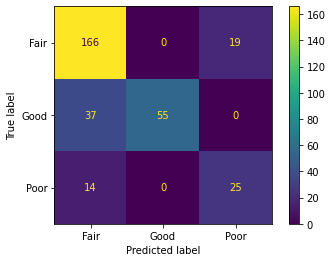

In [85]:
display_cm_rf.plot()   

In [86]:
print(classification_report(y_test, rf_pred, digits=3))

              precision    recall  f1-score   support

        Fair      0.765     0.897     0.826       185
        Good      1.000     0.598     0.748        92
        Poor      0.568     0.641     0.602        39

    accuracy                          0.778       316
   macro avg      0.778     0.712     0.726       316
weighted avg      0.809     0.778     0.776       316



### 5.6.2. Interpretation of Classification Results

- Since our goal is to predict the condition category (Good, Fair, or Poor), we define False Negative (FN) and False Positive (FP) as follows:
  - FN: classify poor bridges as good or fair
  - FP: classify good or fair bridges as poor
- Based on that condition, we concluded that **FN cases would be more of a threat to the public if not well addressed. Therefore, we want to increase TP and lower FN** 
- With that assumption, we would focus more on **recall** that addressed the relation between TP and FN.
- Our best model has an accuracy of 77.8% and a recall rate of 64.1%.
  - $Accuracy = \frac{TP+TN}{N}$
    - The proportion of correctly classified bridge conditions by our model on the test data is 77.8%
  - $Recall = \frac{TP}{TP+FN}$
    - Among all bridges, the percentage of correctly classified poor bridges by our model on the test data is 64.1%. 
  - $Precision = \frac{TP}{TP+FP}$
    - Among all bridges, the percentage of correctly classified poor bridges to the total predicted poor cases is 56.8%

In the context of bridge conditions, while keeping a high accuracy, we want to have as high a recall as possible (the highest priority). However, given the limited government budget, we may also want to spend the money wisely in the right places. On top of high accuracy and high recall, we can also try to increase precision, if possible, to prevent spending extra energy and money on bridges in good shape.

### 5.6.3. Feature Importance

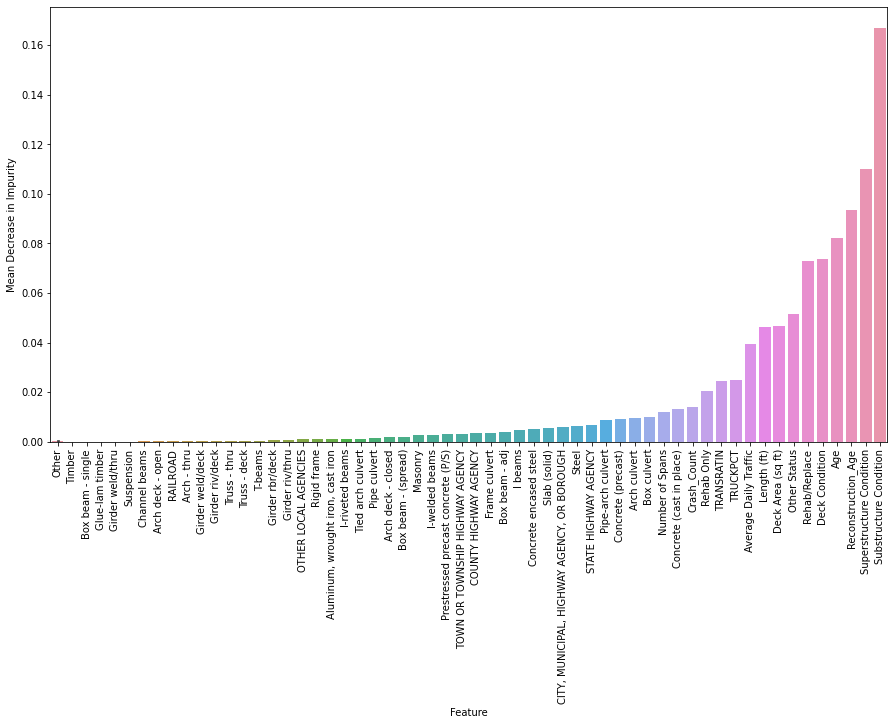

In [87]:
# plot feature importance plot
feature_df = pd.concat([pd.Series(X_train_processed.columns), 
                        pd.DataFrame(rf.feature_importances_)], axis=1)
feature_df.columns = ['Feature', 'Mean Decrease in Impurity']
feature_df.sort_values(by = ['Mean Decrease in Impurity'], inplace=True)
plt.figure(figsize=(15, 8))
plt.xticks(rotation=90)
sns.barplot(x= 'Feature', y= 'Mean Decrease in Impurity', data=feature_df)
plt.show()

According to the best model, the following TOP 6 essential features are associated with bridge condition classification:
1. Substructure Condition
2. Superstructure Condition
3. Reconstruction Age
4. Age
5. Deck Condition
6. Rehab/Replace

These results make sense in that condition of the substructure and superstructure of a bridge directly determines its "usability". Reconstruction age and age indicate how long the bridge has been put into use - older bridges would be more worn and thus subject to higher risks. Deck condition is also related to the bridge's quality, and rehab/replace indicates whether there's recent maintenance done, affecting the bridge's usability. Thus, the government should focus more on these areas when trying to assess the condition of a given bridge.

# 6. Beyond Data: Case Studies

As mentioned in the Problem Statement section, the strategic purpose of this analysis is to enable a strategic preventive action instead of reactive actions of bridge maintenance that cost more and produce other problems. For example, the reparation of the Fern Hollow Bridge in Pittsburgh that collapsed in January 2022 is estimated to be finished by December and cost $25.3 million, according to the Pennsylvania DOT in [Fern Hollow Bridge repair set to wrap by the end of the year](https://www.constructiondive.com/news/fern-hollow-bridge-repair-finish-december-biden-iija/634918/) article. It is one of many effects. For about one year during the replacement work, about 14000 cars travelled over the Fern Hollow Bridge daily, along with two port authority bus routes that run approximately 200 trips a day needed to use alternative routes, as stated in [an article on Pittsburgh's NPR News Station (WESA) website](https://www.wesa.fm/show/the-confluence/2022-01-31/fern-hollow-bridge-carried-14-000-cars-a-day-now-those-drivers-are-seeking-alternate-routes). Imagine how much money we can save if we conduct the targeted and strategic routine inspection work that cost only around 15000 dollars.

With the model we build, the government can predict the category condition of a bridge given bridge features data. However, after getting the classification, for example, all the bridges that classified as Poor, the government still get many bridges. Then, among all those bridges classified as Poor, how will they choose the ones to prioritize the maintenance on?

To answer that, on top of the predicted condition category from the model result, we propose a framework to define the bridge maintenance prioritization that includes four components that will be evaluated in order based on its criticality as follows:
1. Availability of the alternative routes: need to gather outside the dataset
The most critical factor is if the bridge is collapsed and whether we have an alternative route for it. The ones with no alternative routes need to be prioritized first. 
2. Bridge size: need to gather outside the dataset
The next most important factor after the alternate routes' availability is whether this is a big bridge or not. We chose this because the damage level produced by a collapse of big bridges will be worse compared to a smaller bridge. For illustration, if a big bridge that holds many cars at one time on top of a steep gap collapses, it might have more victims and harm compared to smaller bridges above a small creek.
3. Traffic amount: can be obtained from the dataset
The next most important factor after the alternate routes' availability and bridge size is the traffic held by bridges. Similar to the size, the bridge will have more extensive traffic that needs to be prioritized compared to a smaller one.
4. Estimated cost: can be obtained from the dataset
This is the last important factor considered because that might affect the decision but at least for now, because US DOT announced that Pennsylvania was awarded $2.6 billion in FY 2023 formula funding for roads and bridges, carbon reduction, road safety, and more. Source: [United States Department of Transportation](https://highways.dot.gov/newsroom/biden-harris-administration-awards-156-million-bridge-planning-grant-city-philadelphia#:~:text=Earlier%20this%20week%2C%20US%20DOT,%2C%20road%20safety%2C%20and%20more.).

In [88]:
# embed figure
from IPython.display import Image

In [89]:
case_study = df_case_study.iloc[y_test.index]
case_study.insert(0,'pred',rf_pred)
df_poor = case_study[(case_study['pred']=='Poor')&
                     (case_study['pred']==case_study['Condition'])]
df_case = df_poor[~df_poor['Average Daily Traffic'].isna()]
df_case

,pred,Condition,Bridge Id,Location/Structure Name,Owner,Length (ft),Deck Area (sq ft),Number of Spans,Material,Structure Type,Year Built,Deck Condition,Superstructure Condition,Substructure Condition,Culvert Condition,Average Daily Traffic,DEC_LAT,DEC_LONG,YEARRECON,HBRR_ELIG,NBIIMPCOST,NBIRWCOST,NBITOTCOST,TRUCKPCT,TRANSRATIN,Crash_Count,Age,Reconstruction_Age
1091,Poor,Poor,2013600800915,800FT E OF T636,STATE HIGHWAY AGENCY,24,912.0,1,Concrete encased steel,I beams,1915,5,4,5,6,4283.0,40.2021,-79.8629,1936.0,Rehab Only,8.0,25.0,113.0,7.0,3,1,107,86
1170,Poor,Poor,2800405000732,Birmingham Bridge,STATE HIGHWAY AGENCY,67,1909.5,1,Steel,I-riveted beams,1956,6,5,4,NaN,5199.0,40.4333,-79.9833,1985.0,Rehab Only,20.0,100.0,269.0,7.0,8,2,66,37
1114,Poor,Poor,2103300401558,1/4 MI. SOUTH OF SR 1028,STATE HIGHWAY AGENCY,18,405.0,1,Concrete encased steel,I beams,1956,5,5,4,NaN,558.0,40.6583,-79.7594,1992.0,Rehab/Replace,8.0,29.0,102.0,4.0,4,0,66,30
1092,Poor,Poor,2013600803035,@INTERSECT WITH SR 2013,STATE HIGHWAY AGENCY,17,816.0,1,Concrete encased steel,I beams,1925,5,5,4,NaN,4283.0,40.2063,-79.8577,1950.0,Other Status,14.0,40.0,186.0,7.0,8,1,97,72
1127,Poor,Poor,2206400102012,0.4 MI E OF SR 2172,STATE HIGHWAY AGENCY,14,504.0,1,Concrete (cast in place),Slab (solid),1941,4,4,4,NaN,4861.0,40.4743,-79.8411,0.0,Rehab Only,7.0,22.0,99.0,1.0,8,0,81,81
1105,Poor,Poor,2097801600000,200' WEST OF SR 3063,STATE HIGHWAY AGENCY,21,764.4,1,Prestressed precast concrete (P/S),Box beam - adj,1953,6,6,4,NaN,2845.0,40.4096,-80.1931,0.0,Rehab Only,4.0,20.0,57.0,6.0,6,0,69,69
1149,Poor,Poor,2307000640000,SANTIAGO NEAR SR 0030,STATE HIGHWAY AGENCY,32,1248.0,1,Prestressed precast concrete (P/S),Box beam - adj,1955,4,4,5,NaN,1723.0,40.4506,-80.2513,0.0,Rehab Only,9.0,27.0,123.0,4.0,2,0,67,67
1095,Poor,Poor,2040003502218,50' E. OF PIERSON RUN RD.,STATE HIGHWAY AGENCY,20,840.0,1,Concrete (cast in place),Slab (solid),1957,4,4,5,NaN,7917.0,40.4771,-79.7598,0.0,Rehab Only,8.0,25.0,106.0,10.0,2,1,65,65
1148,Poor,Poor,2304900100000,100'S.E.OF SR3108,STATE HIGHWAY AGENCY,14,375.2,1,Concrete (cast in place),Slab (solid),1940,6,6,4,NaN,2456.0,40.3953,-80.2572,0.0,Rehab Only,1.0,3.0,12.0,6.0,4,0,82,82
1158,Poor,Poor,2402800100815,834' N OF SR 0065,STATE HIGHWAY AGENCY,9,175.5,1,Concrete (cast in place),Arch deck - closed,1949,NaN,4,4,NaN,499.0,40.5285,-80.1581,1989.0,Rehab/Replace,12.0,34.0,157.0,1.0,2,0,73,33


To explain the framework better, we give an example of using it with these five bridges chosen from the **Poor** predicted bridges using our model.

In [90]:
# select five different poor bridges
df_case.loc[[1170,1095,1092,1091,1149]]

,pred,Condition,Bridge Id,Location/Structure Name,Owner,Length (ft),Deck Area (sq ft),Number of Spans,Material,Structure Type,Year Built,Deck Condition,Superstructure Condition,Substructure Condition,Culvert Condition,Average Daily Traffic,DEC_LAT,DEC_LONG,YEARRECON,HBRR_ELIG,NBIIMPCOST,NBIRWCOST,NBITOTCOST,TRUCKPCT,TRANSRATIN,Crash_Count,Age,Reconstruction_Age
1170,Poor,Poor,2800405000732,Birmingham Bridge,STATE HIGHWAY AGENCY,67,1909.5,1,Steel,I-riveted beams,1956,6,5,4,NaN,5199.0,40.4333,-79.9833,1985.0,Rehab Only,20.0,100.0,269.0,7.0,8,2,66,37
1095,Poor,Poor,2040003502218,50' E. OF PIERSON RUN RD.,STATE HIGHWAY AGENCY,20,840.0,1,Concrete (cast in place),Slab (solid),1957,4,4,5,NaN,7917.0,40.4771,-79.7598,0.0,Rehab Only,8.0,25.0,106.0,10.0,2,1,65,65
1092,Poor,Poor,2013600803035,@INTERSECT WITH SR 2013,STATE HIGHWAY AGENCY,17,816.0,1,Concrete encased steel,I beams,1925,5,5,4,NaN,4283.0,40.2063,-79.8577,1950.0,Other Status,14.0,40.0,186.0,7.0,8,1,97,72
1091,Poor,Poor,2013600800915,800FT E OF T636,STATE HIGHWAY AGENCY,24,912.0,1,Concrete encased steel,I beams,1915,5,4,5,6,4283.0,40.2021,-79.8629,1936.0,Rehab Only,8.0,25.0,113.0,7.0,3,1,107,86
1149,Poor,Poor,2307000640000,SANTIAGO NEAR SR 0030,STATE HIGHWAY AGENCY,32,1248.0,1,Prestressed precast concrete (P/S),Box beam - adj,1955,4,4,5,NaN,1723.0,40.4506,-80.2513,0.0,Rehab Only,9.0,27.0,123.0,4.0,2,0,67,67


### Example 1: Birmingham Bridge
1) Are there alternative routes around this bridge?
- Yes

2) Is this bridge a giant bridge over a river or a small bridge over a creek?
- It's a giant bridge over the Monongahela River

3) What is the average daily traffic over this bridge?
- 5199

4) What is the estimated cost to maintain/improve this bridge?
- $269k

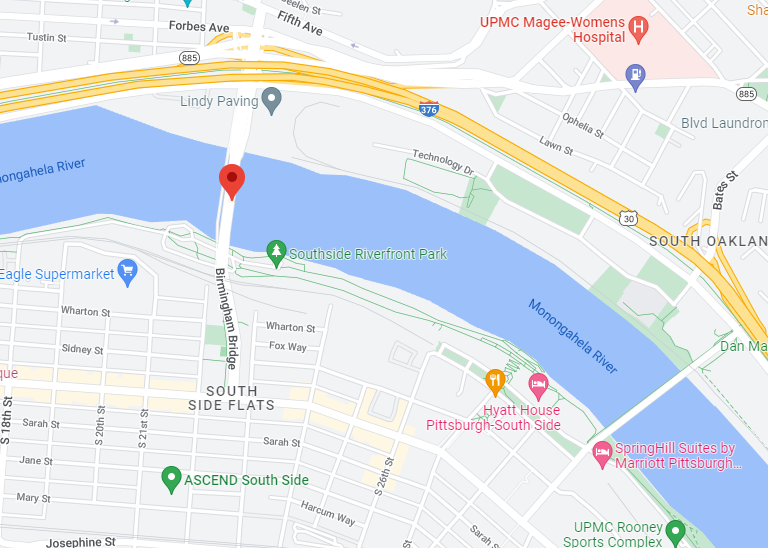

In [91]:
Image("figure/1170.png")

### Example 2: 50' E. OF PIERSON RUN RD.
1) Are there alternative routes around this bridge?
- Yes

2) Is this bridge a giant bridge over a river or a small bridge over a creek?
- It's a small bridge over Plum Creek

3) What is the average daily traffic over this bridge?
- 7917

4) What is the estimated cost to maintain/improve this bridge?
- $106k

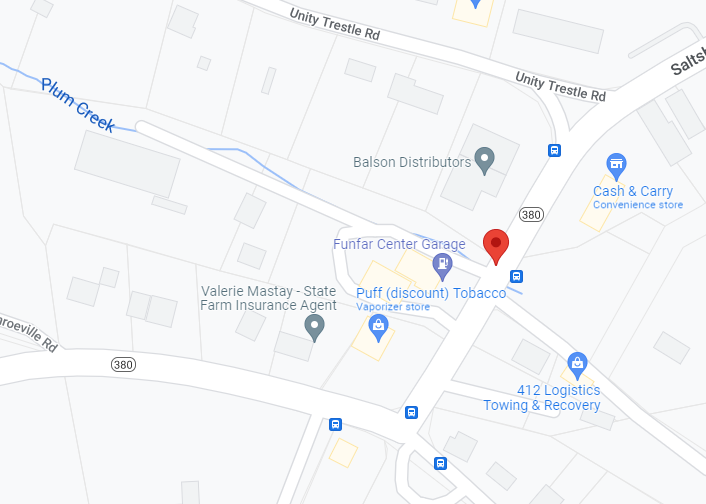

In [92]:
Image("figure/1095.png")

### Example 3: @INTERSECT WITH SR 2013
1) Are there alternative routes around this bridge?
- No

2) Is this bridge a giant bridge over a river or a small bridge over a creek?
- It's a small bridge over Beckets Run

3) What is the average daily traffic over this bridge?
- 4283

4) What is the estimated cost to maintain/improve this bridge?
- $186k

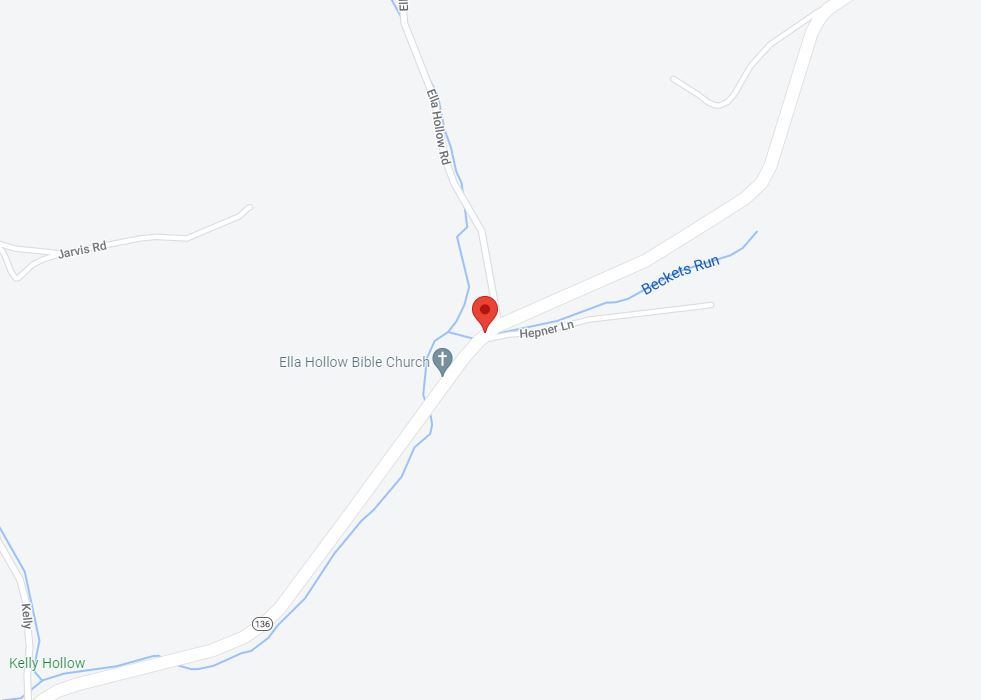

In [93]:
Image("figure/1092.JPG")

### Example 4: 800FT E OF T636
1) Are there alternative routes around this bridge?
- No

2) Is this bridge a giant bridge over a river or a small bridge over a creek?
- It's a small bridge over Beckets Run

3) What is the average daily traffic over this bridge?
- 4283

4) What is the estimated cost to maintain/improve this bridge?
- $113k

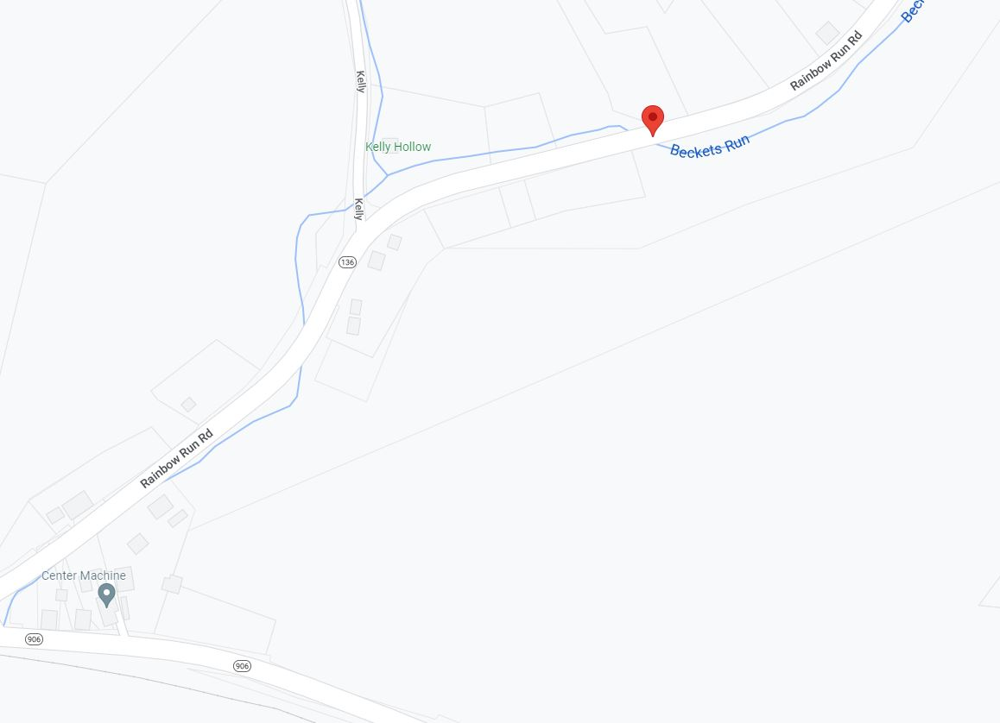

In [94]:
Image("figure/1091.JPG")

### Example 5: SANTIAGO NEAR SR 0030
1) Are there alternative routes around this bridge?
- Yes

2) Is this bridge a giant bridge over a river or a small bridge over a creek?
- It's a small bridge over Little Deer Creek

3) What is the average daily traffic over this bridge?
- 1723

4) What is the estimated cost to maintain/improve this bridge?
- $123k

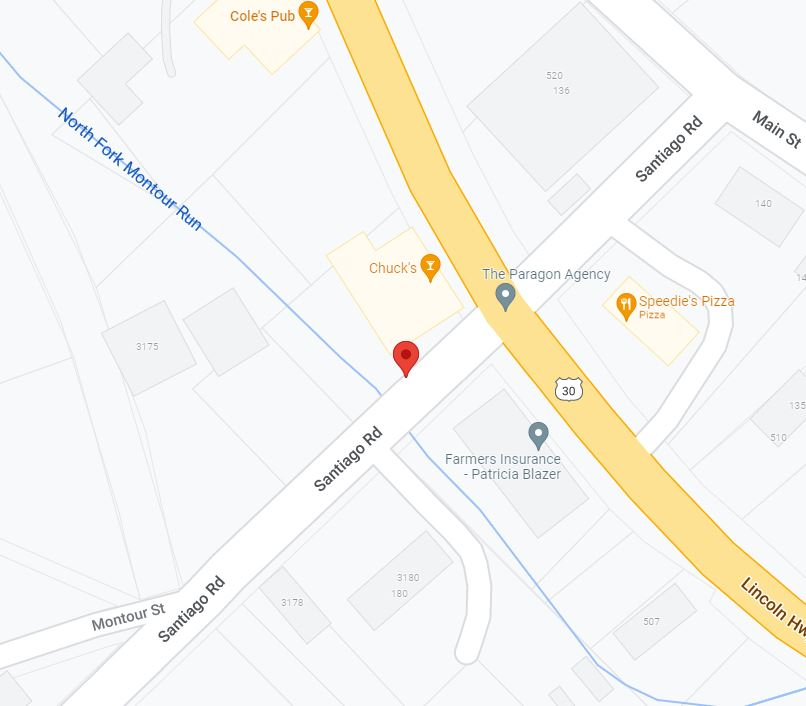

In [95]:
Image("figure/1149.JPG")

Using the proposed framework and based on further investigation of the supporting data above, here is the recommended prioritization of bridge maintenance from those five bridges.

1. 800FT E OF T636 
2. @INTERSECT WITH SR 2013
3. Birmingham Bridge
4. 50' E. OF PIERSON RUN RD
5. SANTIAGO NEAR SR 0030

# 7. Future Recommendation

There are many other valuable things that can be done using the bridges dataset that is out of the scope of this analysis. Here are some recommendations for future analysis utilizing this bridge dataset.
1. Build automated process to implement the prioritization framework.
2. Forecast the individual bridge component condition rating such as deck condition, superstructure condition, or substructure condition with regression
3. Image recognition of the bridge picture to decrease human inspection effort to see early damage/risk detection.
4.  Correlation between weather and bridge risk level.